<a href="https://colab.research.google.com/github/siri2511/Deep-Learning/blob/main/Autonomous_Vehicle_Navigation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**DATA LOADING & PREPROCESSING**

In [ ]:
#cloning the training data repository which contains image + csv file
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 15.70 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
#importing necessary libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
datadir='track'
columns=['center','left','right','steering','throttle','reverse','speed']
data=pd.read_csv(os.path.join(datadir,'driving_log.csv'),names=columns)
#display the entire file path (instead of ...)
pd.set_option('display.max_colwidth',None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
def path_leaf(path):
    head, tail= ntpath.split(path)
    return tail

data['center']=data['center'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


<BarContainer object of 25 artists>

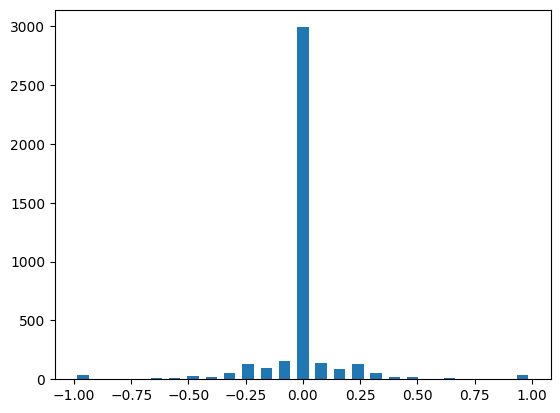

In [ ]:
num_bins=25
hist, bins= np.histogram(data['steering'], num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center, hist, width=0.05)

* negative indicates left steering side <br />
* positive indicates right steering side <br />
* 0 indicates no steering <br />
* The data is populated on zero because the majority of the steering angles were 0 while driving in training mode <br />
* There is a need to remove data indicating 0 as the model may show biases towards predicting 0 as steering angle <br />

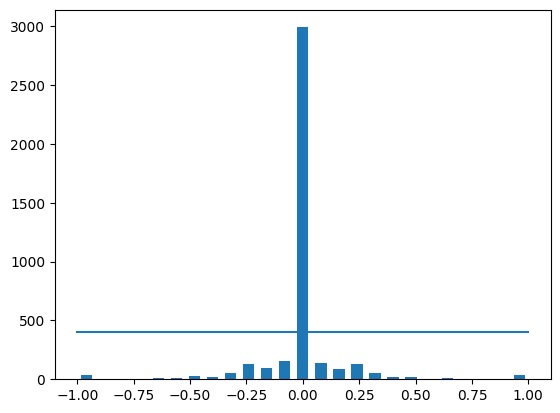

In [ ]:
num_bins=25
#samples_per_bin value can be alerted according to performace
samples_per_bin=400
hist, bins= np.histogram(data['steering'], num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])),(samples_per_bin, samples_per_bin)) #include line in the plot

* for balaning the data, keep zero indicating data till 400 bins and remove the rest (400 as threshold)

In [ ]:
#shape of the data
print('total data:',len(data))
print(data.shape)

total data: 4053
(4053, 7)


* 7 columns
* 4053 rows

**DATA BALANCING**

In [ ]:
remove_list=[]
for j in range(num_bins):
    list_=[]
    for i in range(len(data['steering'])):
        if data['steering'][i]>=bins[j] and data['steering'][i]<=bins[j+1]:
            list_.append(i)
    list_=shuffle(list_)
    list_=list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed: ',len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print('remaining: ',len(data))

removed:  2590
remaining:  1463


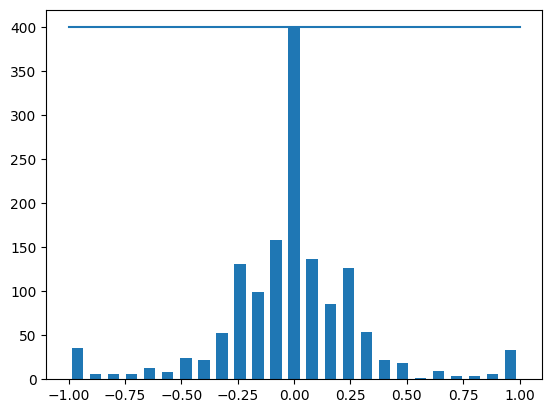

In [ ]:
#plot normalized data
hist, bins= np.histogram(data['steering'], num_bins)
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])),(samples_per_bin, samples_per_bin))

**Training & Validation Split**

In [ ]:
def load_img_steering(datadir, df):
    image_path=[]
    steering=[]
    for i in range(len(data)):
        indexed_data=data.iloc[i]
        center, left, right=indexed_data[0], indexed_data[1],indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        #left image append
        image_path.append(os.path.join(datadir, left.strip()))
        steering .append(float(indexed_data[3])+0.15)
        #right image append
        image_path.append(os.path.join(datadir, right.strip()))
        steering .append(float(indexed_data[3]-0.15))
    image_paths=np.asarray(image_path)
    steerings=np.asarray(steering)
    return image_paths, steerings

In [ ]:
image_paths, steerings= load_img_steering(datadir+'/IMG',data)

<ipython-input-10-b4fced78e557>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right=indexed_data[0], indexed_data[1],indexed_data[2]
<ipython-input-10-b4fced78e557>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
<ipython-input-10-b4fced78e557>:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering .append(float(indexed_data[3])+0.15)
<ipython-input-10-b4fced78e557>:14: F

In [ ]:
#image_paths
len(image_paths)

4389

In [ ]:
#steerings
len(steerings)

4389

In [ ]:
X_train, X_valid, y_train, y_valid=train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train),len(X_valid)))

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation set')

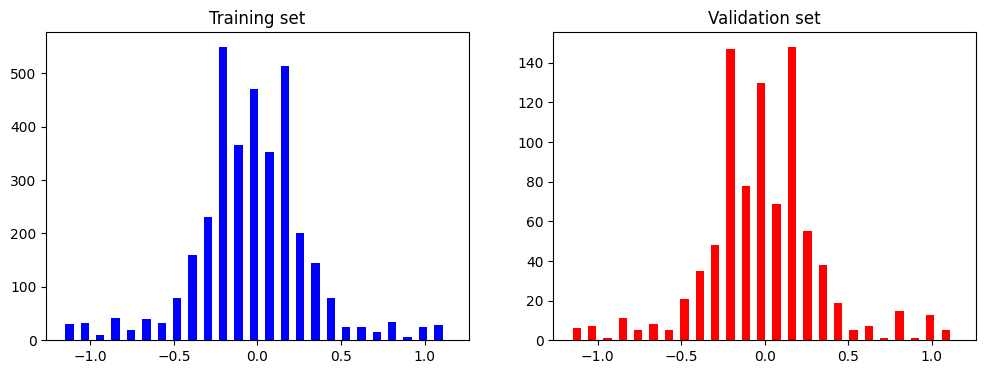

In [ ]:
#plotting training and validation sets
fig, axes=plt.subplots(1,2,figsize=(12,4))
axes[0].hist(y_train,bins=num_bins,width=0.05,color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid,bins=num_bins,width=0.05,color='red')
axes[1].set_title('Validation set')

**DATA AUGMENTATION**

Text(0.5, 1.0, 'Zoomed Image')

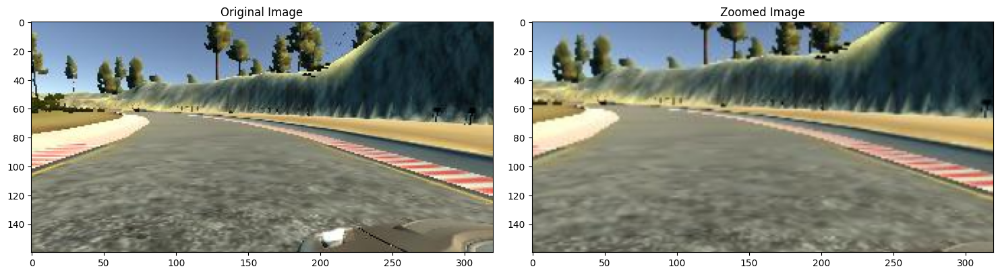

In [ ]:
#performing zooming]
def zoom(image):
    zoom=iaa.Affine(scale=(1,1.3))
    image=zoom.augment_image(image)
    return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
zoomed_image=zoom(original_image)

fig, axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

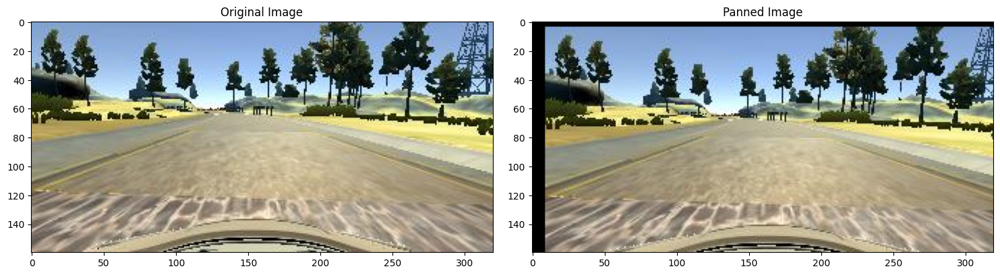

In [ ]:
#performing pan
def pan(image):
    pan=iaa.Affine(translate_percent={'x':(-0.1,0.1),'y':(-0.1,0.1)})
    image=pan.augment_image(image)
    return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
panned_image=pan(original_image)

fig, axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Random Bright Image')

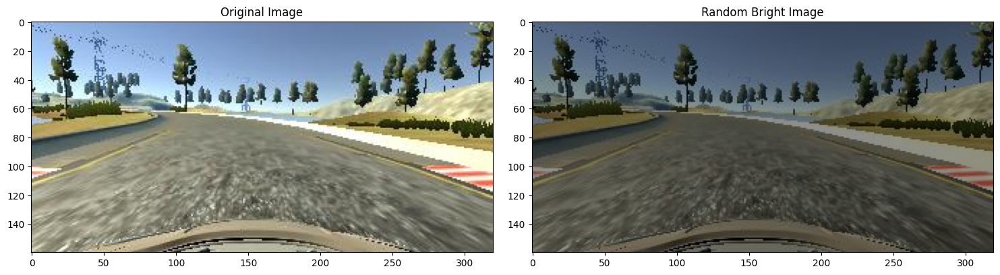

In [ ]:
#Applying random brightness
def img_random_brightness(image):
    brightness=iaa.Multiply((0.2,1.2))
    image=brightness.augment_image(image)
    return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
random_bright_image=img_random_brightness(original_image)

fig, axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(random_bright_image)
axs[1].set_title('Random Bright Image')

Text(0.5, 1.0, 'Flipped Image -Steering Angle: 0.3')

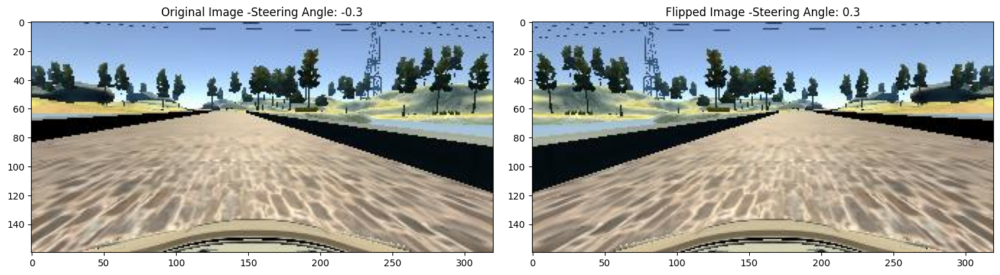

In [ ]:
#performing random flip
def img_random_flip(image, steering_angle):
    image=cv2.flip(image,1)
    steering_angle = -steering_angle
    return image,steering_angle

random_index=random.randint(0,1000)
image=image_paths[random_index]
steering_angle=steerings[random_index]

original_image=mpimg.imread(image)
flipped_image, flipped_steering_angle=img_random_flip(original_image, steering_angle)

fig, axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image -'+ 'Steering Angle: '+ str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image -'+'Steering Angle: '+str(flipped_steering_angle))

In [ ]:
#Define a function to call augmentation techniques
def random_augment(image, steering_angle):
    image=mpimg.imread(image)
    if np.random.rand()<0.5:
        image=pan(image)
    if np.random.rand()<0.5:
        image=zoom(image)
    if np.random.rand()<0.5:
        img=img_random_brightness(image)
    if np.random.rand()<0.5:
        image, steering_angle=img_random_flip(image, steering_angle)

    return image, steering_angle

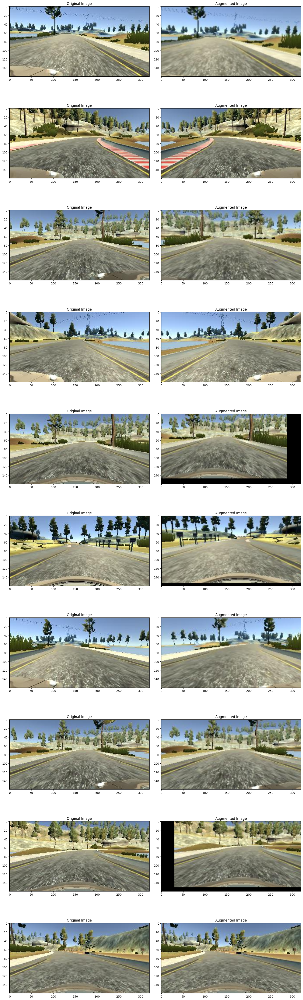

In [ ]:
ncol=2
nrow=10

fig,axs=plt.subplots(nrow,ncol,figsize=(15,50))
fig.tight_layout()

for i in range(10):
    randnum=random.randint(0, len(image_paths)-1)
    random_image=image_paths[randnum]
    random_steering=steerings[randnum]

    original_image=mpimg.imread(random_image)
    augmented_image, steering=random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title('Original Image')

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title('Augmented Image')

**IMAGE PREPROCESSING**

* Since image contains unwanted background it is necessary to remove it. To falicitate smooth convolution.
* Converts RGB images to YUV images. The format accepted by NVDIA model is YUV format. Different formats for differrent models.

In [ ]:
def img_preprocess(img):
    #image is 3D array : height, width, channel
    img=img[60:135,:,:]
    #changing RGB image to YUV image
    img=cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    #applying gausian blur
    img=cv2.GaussianBlur(img, (3,3), 0)
    #resizing the image as input size of the NVDIA model is (200,66)
    img=cv2.resize(img, (200,66))
    #scale down the input
    img=img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

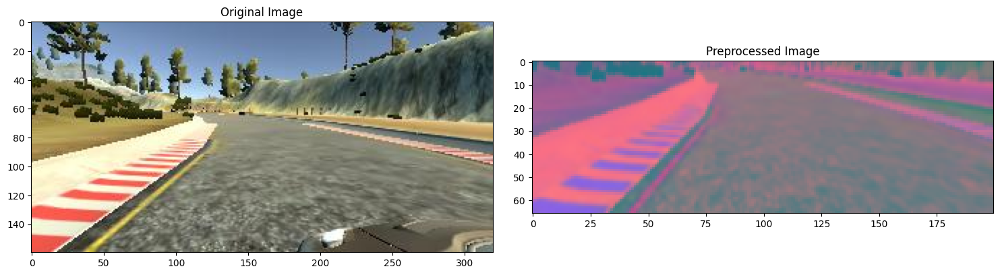

In [ ]:
#testing on one image
image=image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image=img_preprocess(original_image)

fig,axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

**BATCH GENERATOR**

* Pass input to model in batches. Because if the input is high, the memory might get crashed

In [ ]:
#checking the environment
!nvidia-smi

Thu Oct 31 16:45:35 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img=[]
        batch_steering=[]

        for i in range(batch_size):
            random_index=random.randint(0, len(image_paths)-1)

            if istraining:
                im, steering=random_augment(image_paths[random_index],steering_ang[random_index])

            else:
                im=mpimg.imread(image_paths[random_index])
                steering=steering_ang[random_index]

            im=img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

In [ ]:
#batch size is 1, increased during training process
x_train_gen, y_train_gen=next(batch_generator(X_train,y_train,1,1))
x_valid_gen, y_valid_gen=next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

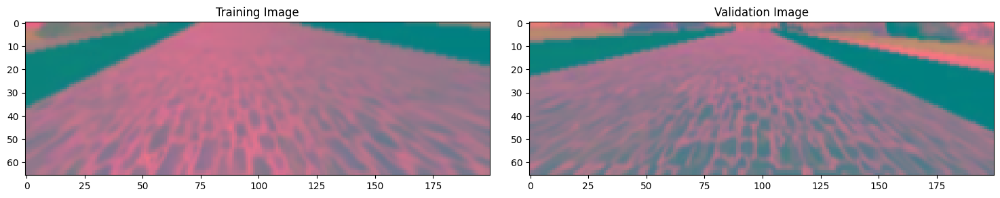

In [ ]:
fig, axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

**BUILDING NVIDIA MODEL**

* Base Paper: End-to-end learning fo self-driving cars

In [30]:
import tensorflow as tf

* Commented out certain layers of the model due to time constraint
* All layers can be implemented too for experimenting by commenting out the various layers

In [31]:
def nvidia_model():
    model=Sequential()
    model.add(Conv2D(24,(5,5), strides=(2,2), input_shape=(66, 200, 3),activation='elu'))
    model.add(Conv2D(36,(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(48,(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(64,(5,5), activation='elu'))
    #model.add(Conv2D(64,(3,3), activation='elu'))
    #model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    #model.add(Dropout(0.5))
    model.add(Dense(50, activation='elu'))
    #model.add(Dropout(0.5))
    model.add(Dense(10, activation='elu'))
    #model.add(Dropout(0.5))
    model.add(Dense(1))

    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse',optimizer=optimizer)
    return model

model=nvidia_model()
print(model.summary())

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 1, 18, 64)           │          76,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


**TRAINING THE MODEL**

In [34]:
history=model.fit(batch_generator(X_train,y_train, 100,1),
                            steps_per_epoch=300,
                            epochs=10,
                            validation_data=batch_generator(X_valid, y_valid, 100, 0),
                            validation_steps=200,
                            verbose=1,
                            shuffle=1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 141s 449ms/step - loss: 0.3579 - val_loss: 0.0638
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 151s 506ms/step - loss: 0.0718 - val_loss: 0.0497
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 142s 473ms/step - loss: 0.0601 - val_loss: 0.0404
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 119s 399ms/step - loss: 0.0508 - val_loss: 0.0361
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 123s 412ms/step - loss: 0.0452 - val_loss: 0.0362
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 124s 416ms/step - loss: 0.0462 - val_loss: 0.0302
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 117s 391ms/step - loss: 0.0420 - val_loss: 0.0299
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 117s 390ms/step - loss: 0.0400 - val_loss: 0.0282
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 118s 396ms/step - loss: 0.0387 - val_loss: 0.0277
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 116s 387ms/step - loss: 0.0395 - val_loss: 0.0272


Text(0.5, 0, 'Epoch')

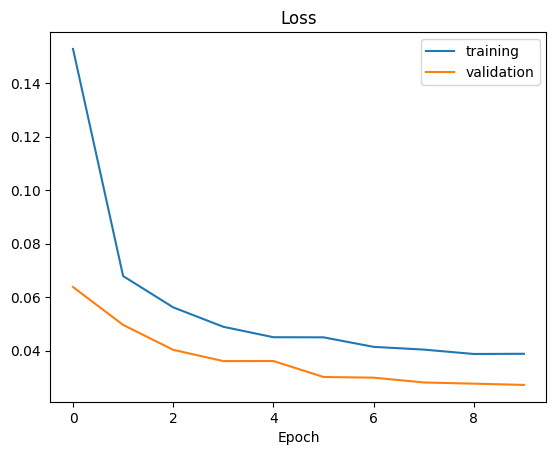

In [35]:
#plotting validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training','validation'])
plt.title('Loss')
plt.xlabel('Epoch')

* saving the model to pass predictions to udacity simulator via drive.py (socket.io)

In [36]:
#saving the model
model.save('model.h5')
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>